# Data Exploration

In [2]:
import sys
import os
from dotenv import load_dotenv

# load environment variables
load_dotenv()

#add working directory to sys path to execute utils/dataset.py
working_dir = os.environ.get("WORKING_DIRECTORY")
sys.path.insert(0, working_dir)

In [3]:
from utils.dataset import get_data 

df = get_data()
df.head()

Loading data from wines: 8000it [00:00, 27116.40it/s]


,wine type,fixed acidity,volatile acidity,citric acid,residual sugar,magnesium,flavanoids,minerals,calcium,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,Pinot noir,5.8,0.15,0.49,1.1,76.729301,894.94,186.639301,109.91,0.048,21.0,98.0,0.99290,3.19,0.48,9.2,5
1,Merlot,6.6,0.25,0.32,5.6,4.795712,1160.95,251.875712,247.08,0.039,15.0,68.0,0.99163,2.96,0.52,11.1,6
2,Chardonnay,6.7,0.21,0.34,1.5,85.193710,789.82,304.703710,219.51,0.035,45.0,123.0,0.98949,3.24,0.36,12.6,7
3,Merlot,8.3,0.28,0.27,17.5,11.976525,777.86,237.586525,225.61,0.045,48.0,253.0,1.00014,3.02,0.56,9.1,6
4,Merlot,7.5,0.42,0.19,6.9,5.599673,785.72,95.399673,89.80,0.041,62.0,150.0,0.99508,3.23,0.37,10.0,6


wine type               0
fixed acidity           0
volatile acidity        0
citric acid             6
residual sugar          8
magnesium               8
flavanoids              8
minerals                8
calcium                 8
chlorides               8
free sulfur dioxide     8
total sulfur dioxide    8
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64
       fixed acidity  volatile acidity  citric acid  residual sugar  \
count    8000.000000       8000.000000  8000.000000     8000.000000   
mean        6.856625          0.278486     0.334929        6.406219   
std         0.841727          0.100296     0.120204        5.101763   
min         3.800000          0.080000     0.000000        0.600000   
25%         6.300000          0.210000     0.270000        1.700000   
50%         6.800000          0.260000     0.320000        5.200000   
75%         7.300000          0.320000     0.390

C:\Users\marvi\AppData\Local\Temp\ipykernel_1124\413248673.py:13: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.fillna(df.mean(), inplace=True)
C:\Users\marvi\AppData\Local\Temp\ipykernel_1124\413248673.py:19: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


                 Feature      Score
14               alcohol  11.988332
8              chlorides  11.267709
11               density   4.906592
4              magnesium   2.919659
7                calcium   2.576430
0          fixed acidity   2.325360
10  total sulfur dioxide   2.262338
2            citric acid   2.201578
6               minerals   0.708985
9    free sulfur dioxide   0.696566
3         residual sugar   0.556090
5             flavanoids   0.491333
13             sulphates   0.260982
1       volatile acidity   0.186296
12                    pH   0.071673


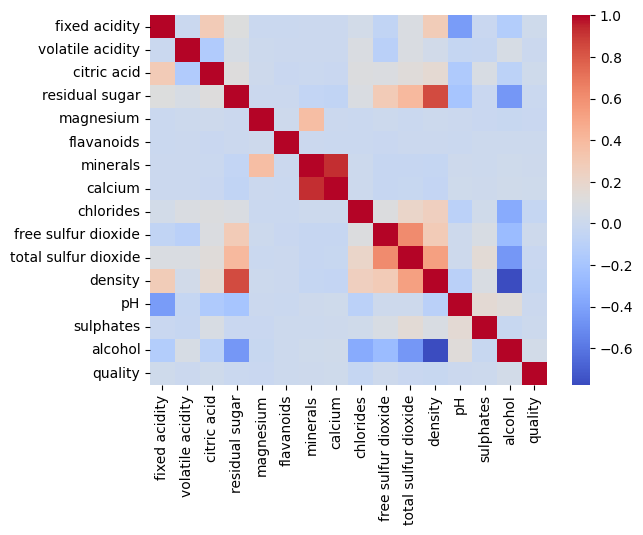

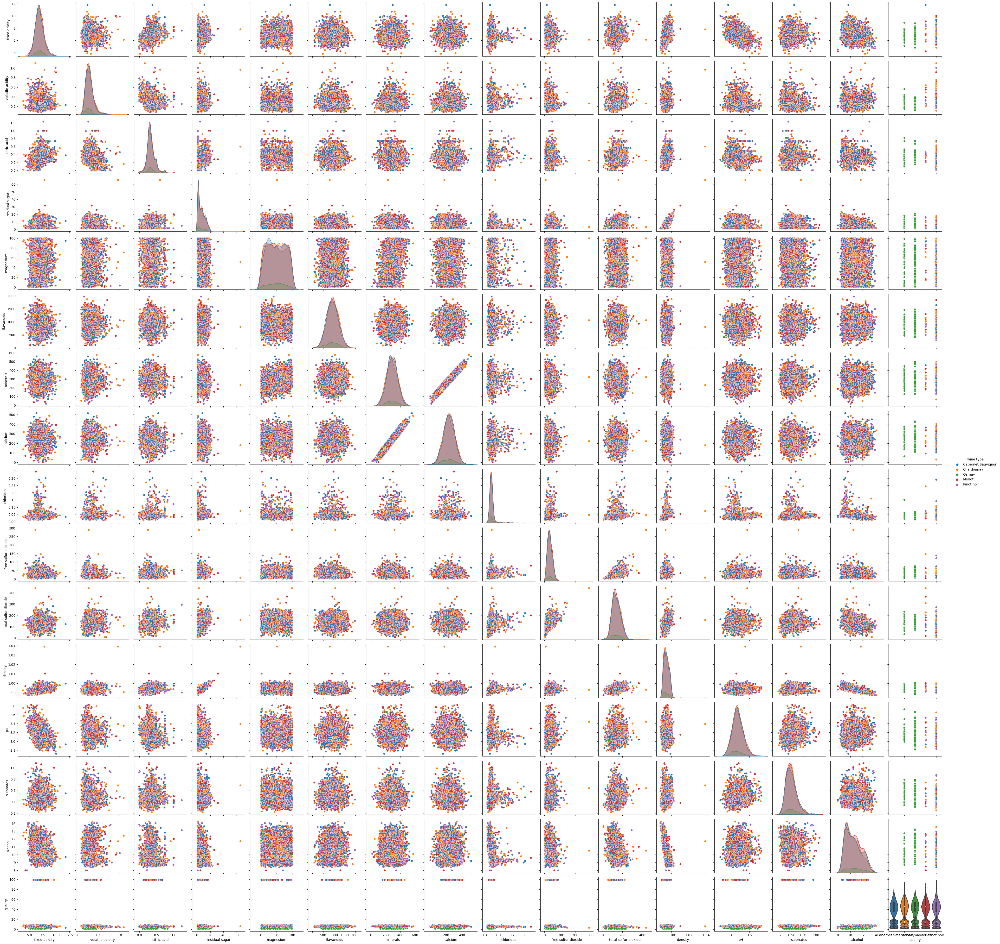

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Convert wine_type column to category data type
df['wine type'] = df['wine type'].astype('category')

# Check for missing values in the dataset
print(df.isnull().sum())

# Replace NaN values with the mean value for that column
df.fillna(df.mean(), inplace=True)

# Compute summary statistics for the dataset
print(df.describe())

# Compute correlation matrix between the features
corr_matrix = df.corr()
print(corr_matrix)

# Visualize the correlation matrix as a heatmap
sns.heatmap(corr_matrix, cmap='coolwarm')

# Visualize pairwise relationships between the variables
sns.pairplot(df, hue='wine type')

# Use SelectKBest to find the most important features
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

X = df.drop(['quality', 'wine type'], axis=1)
y = df['quality']

k_best = SelectKBest(score_func=f_regression, k=5)
fit = k_best.fit(X, y)

# Print the scores for the selected features
feature_scores = pd.DataFrame({'Feature': X.columns, 'Score': fit.scores_})
feature_scores = feature_scores.sort_values(by='Score', ascending=False)
print(feature_scores)

# Visualize the top 5 features as a bar chart
sns.barplot(x='Feature', y='Score', data=feature_scores.head(5))

# Visualize the distribution of quality scores by wine type
sns.violinplot(x='wine type', y='quality', data=df)

# Visualize the distribution of each feature by wine type
for col in X.columns:
    sns.violinplot(x='wine type', y=col, data=df)